
Breast Cancer Wisconsin (Diagnostic) Data Set, Algorithme KNN

In [149]:
#Premièrement, nous importons des pandas et chargeons le jeu de données.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


#permettre aux tracés d'apparaître dans le cahier
%matplotlib inline

In [150]:
df=pd.read_csv('data/breast.csv')

Nous allons utiliser les méthodes simples suivantes pour nous aider à comprendre le contenu des données:   

In [151]:
# .head()  la fonction qui montre une représentation de style Excel des données.
df.head()

#afficher les 5 premières lignes de l'ensemble de données

,id_number,Clump_Thickness,Uniformity_Cell_Size,Uniformity_Cell_Shape,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses,Class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [152]:
# .shape    l'attribut qui affiche les dimensions de l'ensemble de données
df.shape

(699, 11)

Nous pouvons voir qu'il y a 699 instances et 11 attributs dans l'ensemble de données.

Dans la description du jeu de données, il est indiqué qu'il y a 10 attributs et 1 Classe qui est la variable cible.

In [153]:
# .describe()  la fonction qui représente l'information statistique des données.

df.describe()

,id_number,Clump_Thickness,Uniformity_Cell_Size,Uniformity_Cell_Shape,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bland_Chromatin,Normal_Nucleoli,Mitoses,Class
count,6.990000e+02,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000
mean,1.071704e+06,4.417740,3.134478,3.207439,2.806867,3.216023,3.437768,2.866953,1.589413,2.689557
std,6.170957e+05,2.815741,3.051459,2.971913,2.855379,2.214300,2.438364,3.053634,1.715078,0.951273
min,6.163400e+04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000
25%,8.706885e+05,2.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000
50%,1.171710e+06,4.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000,1.000000,2.000000
75%,1.238298e+06,6.000000,5.000000,5.000000,4.000000,4.000000,5.000000,4.000000,1.000000,4.000000
max,1.345435e+07,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,4.000000


Afficher le résumé de l'ensemble de données

In [154]:
# .info() la fonction qui affiche des informations, telles que le type de données et si la colonne contient des champs nuls

# afficher le résumé de l'ensemble de données
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   id_number                    699 non-null    int64 
 1   Clump_Thickness              699 non-null    int64 
 2   Uniformity_Cell_Size         699 non-null    int64 
 3   Uniformity_Cell_Shape        699 non-null    int64 
 4   Marginal_Adhesion            699 non-null    int64 
 5   Single_Epithelial_Cell_Size  699 non-null    int64 
 6   Bare_Nuclei                  699 non-null    object
 7   Bland_Chromatin              699 non-null    int64 
 8   Normal_Nucleoli              699 non-null    int64 
 9   Mitoses                      699 non-null    int64 
 10  Class                        699 non-null    int64 
dtypes: int64(10), object(1)
memory usage: 60.2+ KB


Nous pouvons voir qu'il y a 10 variables numériques et 1 variable catégorique dans l'ensemble de données. 

In [155]:
#Convertir le type de données de Bare_Nuclei en nombre entier.

df['Bare_Nuclei'] = pd.to_numeric(df['Bare_Nuclei'], errors='coerce')

In [156]:
#Vérifier les types de données des colonnes de dataframe

df.dtypes

id_number                        int64
Clump_Thickness                  int64
Uniformity_Cell_Size             int64
Uniformity_Cell_Shape            int64
Marginal_Adhesion                int64
Single_Epithelial_Cell_Size      int64
Bare_Nuclei                    float64
Bland_Chromatin                  int64
Normal_Nucleoli                  int64
Mitoses                          int64
Class                            int64
dtype: object

Maintenant, nous pouvons voir que toutes les colonnes du dataframe sont de type numeric et la colonne redondante id_number  a été supprimée de l'ensemble de données.

Résumé des variables

* Il y a 10 variables numériques dans l'ensemble de données.
* Toutes les variables sont de type discret.
* Sur l'ensemble des 10 variables, les 9 variables de fonction et la dernière variable Class est la variable cible.

Valeurs manquantes dans les variables

In [157]:
#vérifier les valeurs manquantes dans les variables

df.isnull().sum()

id_number                       0
Clump_Thickness                 0
Uniformity_Cell_Size            0
Uniformity_Cell_Shape           0
Marginal_Adhesion               0
Single_Epithelial_Cell_Size     0
Bare_Nuclei                    16
Bland_Chromatin                 0
Normal_Nucleoli                 0
Mitoses                         0
Class                           0
dtype: int64

Nous pouvons voir que la colonne Bare_Nuclei contient des valeurs manquantes.

In [158]:
# vérifier les valeurs 'na' dans la trame de données

df.isna().sum()

id_number                       0
Clump_Thickness                 0
Uniformity_Cell_Size            0
Uniformity_Cell_Shape           0
Marginal_Adhesion               0
Single_Epithelial_Cell_Size     0
Bare_Nuclei                    16
Bland_Chromatin                 0
Normal_Nucleoli                 0
Mitoses                         0
Class                           0
dtype: int64

Nous pouvons voir que la colonne Bare_Nuclei contient 16 valeurs nan.

In [159]:
# compter les lignes en double
df.duplicated().sum()   

8

In [160]:
# examiner les lignes en double
df.loc[df.duplicated(), :]   

,id_number,Clump_Thickness,Uniformity_Cell_Size,Uniformity_Cell_Shape,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses,Class
208,1218860,1,1,1,1,1,1.0,3,1,1,2
253,1100524,6,10,10,2,8,10.0,7,3,3,4
254,1116116,9,10,10,1,10,8.0,3,3,1,4
258,1198641,3,1,1,1,2,1.0,3,1,1,2
272,320675,3,3,5,2,3,10.0,7,1,1,4
338,704097,1,1,1,1,1,1.0,2,1,1,2
561,1321942,5,1,1,1,2,1.0,3,1,1,2
684,466906,1,1,1,1,2,1.0,1,1,1,2


In [161]:
df.drop_duplicates(inplace=True)

In [162]:
#supprimer  les colonnes  qui n'ont aucun pouvoir prédictif. Ici, Id_number est la colonne redondante.

df=df.drop(columns=['id_number'])
df

,Clump_Thickness,Uniformity_Cell_Size,Uniformity_Cell_Shape,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses,Class
0,5,1,1,1,2,1.0,3,1,1,2
1,5,4,4,5,7,10.0,3,2,1,2
2,3,1,1,1,2,2.0,3,1,1,2
3,6,8,8,1,3,4.0,3,7,1,2
4,4,1,1,3,2,1.0,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...
694,3,1,1,1,3,2.0,1,1,1,2
695,2,1,1,1,2,1.0,1,1,1,2
696,5,10,10,3,7,3.0,8,10,2,4
697,4,8,6,4,3,4.0,10,6,1,4


In [163]:
# vérifier la distribution de fréquence de la colonne "Bare_Nuclei"

df['Bare_Nuclei'].value_counts()

1.0     397
10.0    130
2.0      30
5.0      30
3.0      28
8.0      20
4.0      19
9.0       9
7.0       8
6.0       4
Name: Bare_Nuclei, dtype: int64

In [164]:
# vérifier les valeurs uniques dans la colonne "Bare_Nuclei"

df['Bare_Nuclei'].unique()

array([ 1., 10.,  2.,  4.,  3.,  9.,  7., nan,  5.,  8.,  6.])

In [165]:
# check for nan values in `Bare_Nuclei` column

df['Bare_Nuclei'].isna().sum()

16

Nous pouvons voir qu'il y a 16 valeurs nan dans l'ensemble de données.

In [167]:
# remplir les valeurs manquantes avec une valeur spécifiée

value_median=df['Bare_Nuclei'].median()
df['Bare_Nuclei'].fillna(value=value_median, inplace=True)

Data Visualization


Pour mieux comprendre nos données  tracer les histogrammes pour vérifier les distributions variables afin de savoir si elles sont normales ou asymétriques.

In [168]:
#Distribution des valeurs dans les variables
for i in df.columns:  print(df[i].value_counts())

1     142
5     129
3     106
4      80
10     69
2      50
8      46
6      33
7      23
9      13
Name: Clump_Thickness, dtype: int64
1     379
10     65
3      51
2      45
4      40
5      30
8      29
6      27
7      19
9       6
Name: Uniformity_Cell_Size, dtype: int64
1     348
2      59
10     56
3      56
4      44
5      33
6      30
7      30
8      28
9       7
Name: Uniformity_Cell_Shape, dtype: int64
1     401
3      58
2      56
10     55
4      33
8      25
5      23
6      22
7      13
9       5
Name: Marginal_Adhesion, dtype: int64
2     383
3      71
4      48
1      45
6      41
5      39
10     30
8      20
7      12
9       2
Name: Single_Epithelial_Cell_Size, dtype: int64
1.0     413
10.0    130
2.0      30
5.0      30
3.0      28
8.0      20
4.0      19
9.0       9
7.0       8
6.0       4
Name: Bare_Nuclei, dtype: int64
2     165
3     161
1     151
7      71
4      40
5      34
8      28
10     20
9      11
6      10
Name: Bland_Chromatin, dtype: int64
1     4

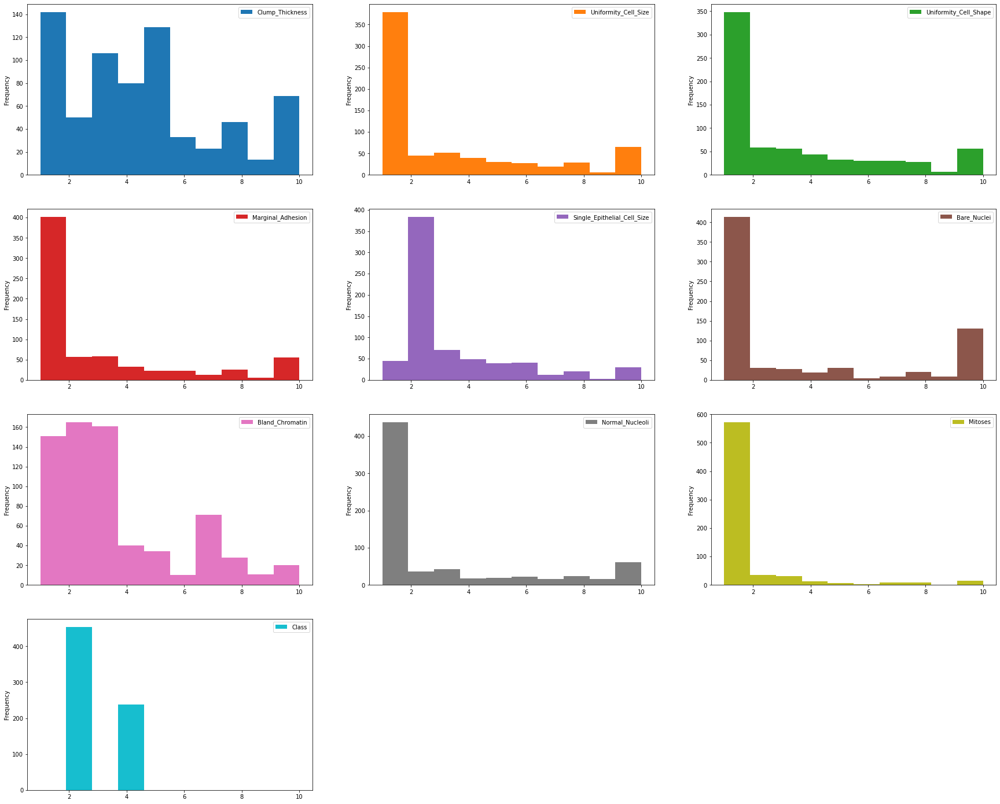

In [169]:
# tracer les histogrammes des variables


plt.rcParams['figure.figsize']=(30,25)

df.plot(kind='hist', bins=10, subplots=True, layout=(4,3), sharex=False, sharey=False)

plt.show()

Nous pouvons voir que toutes les variables de l'ensemble de données sont positivement biaisées.

In [170]:
# afficher le pourcentage de distribution de fréquence des valeurs dans la variable "Classe"

df['Class'].value_counts()/len(df)


2    0.655572
4    0.344428
Name: Class, dtype: float64

Nous pouvons voir que la variable Class contient deux étiquettes de classe - 2 et 4,
2 signifie cancer bénin et 4 signifie cancer malin.

<AxesSubplot:xlabel='Class'>

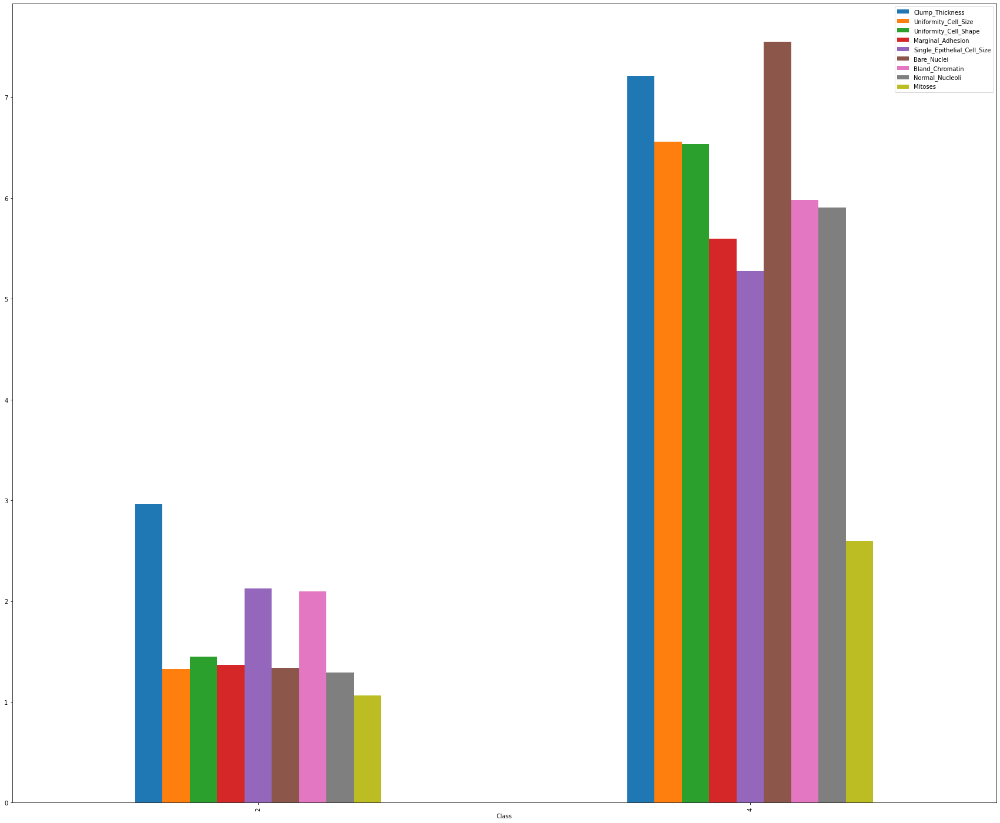

In [171]:
# diagramme à barres pour la variable Class
df.groupby('Class').mean().plot(kind='bar')

In [173]:
# calculer un tableau croisé de deux séries Class et Bare_Nuclei
pd.crosstab(df.Class,df.Bare_Nuclei)

Bare_Nuclei,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
Class,,,,,,,,,,
2,396,21,14,6,10,0,1,2,0,3
4,17,9,14,13,20,4,7,18,9,127


In [174]:
# calculer un tableau croisé de deux séries Class et Clump_Thickness
pd.crosstab(df.Class,df.Clump_Thickness)

Clump_Thickness,1,2,3,4,5,6,7,8,9,10
Class,,,,,,,,,,
2,139,46,95,68,84,16,1,4,0,0
4,3,4,11,12,45,17,22,42,13,69


Estimating correlation coefficients

Nous pouvons calculer le coefficient de corrélation standard (également appelé r de Pearson) entre chaque paire d'attributs en utilisant la méthode df.corr() :


In [175]:
#inverser l'ordre des colonnes pour  la variable Class 
#df=df.loc[:, ::-1]

In [176]:
correlation = df.corr()
correlation

,Clump_Thickness,Uniformity_Cell_Size,Uniformity_Cell_Shape,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses,Class
Clump_Thickness,1.000000,0.643340,0.653752,0.487949,0.517448,0.590841,0.561076,0.535712,0.350354,0.716938
Uniformity_Cell_Size,0.643340,1.000000,0.905420,0.713117,0.747111,0.684791,0.759525,0.727239,0.460064,0.817720
Uniformity_Cell_Shape,0.653752,0.905420,1.000000,0.690989,0.714393,0.704382,0.738455,0.724693,0.440592,0.817693
Marginal_Adhesion,0.487949,0.713117,0.690989,1.000000,0.608477,0.672719,0.669813,0.602453,0.417167,0.701371
Single_Epithelial_Cell_Size,0.517448,0.747111,0.714393,0.608477,1.000000,0.580709,0.620518,0.634058,0.482644,0.681233
Bare_Nuclei,0.590841,0.684791,0.704382,0.672719,0.580709,1.000000,0.672687,0.578417,0.343020,0.816787
Bland_Chromatin,0.561076,0.759525,0.738455,0.669813,0.620518,0.672687,1.000000,0.669059,0.343821,0.756618
Normal_Nucleoli,0.535712,0.727239,0.724693,0.602453,0.634058,0.578417,0.669059,1.000000,0.427644,0.715540
Mitoses,0.350354,0.460064,0.440592,0.417167,0.482644,0.343020,0.343821,0.427644,1.000000,0.424111
Class,0.716938,0.817720,0.817693,0.701371,0.681233,0.816787,0.756618,0.715540,0.424111,1.000000


Interprétation

1.Le coefficient de corrélation varie de -1 à +1. 

2.Quand il est proche de +1, cela signifie qu'il y a une forte corrélation positive.

3.Ainsi, nous pouvons voir qu'il existe une forte corrélation positive entre Class et Bare_Nuclei, Classe et Uniformity_Cell_Shape, Classe et Uniformity_Cell_Size

4.Quand Le coefficient de corrélation est proche de -1, cela signifie qu'il y a une forte corrélation négative.

5.Quand il est proche de 0, cela signifie qu'il n'y a pas de corrélation.

6.Nous pouvons voir que toutes les variables sont positivement corrélées avec la variable de classe.

7.Certaines variables sont fortement corrélées positivement tandis que certaines variables sont corrélées négativement.

Carte thermique (Heat Map) de corrélation



<AxesSubplot:>

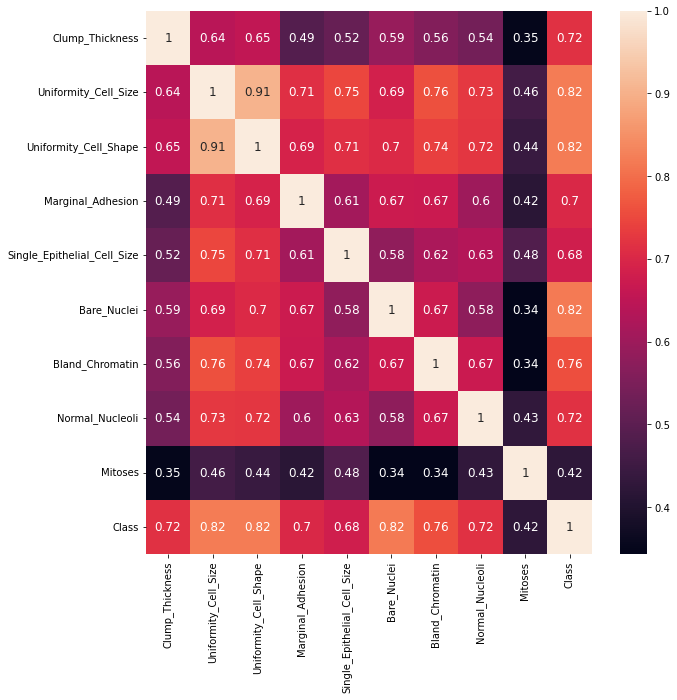

In [177]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(data=df.corr().round(3),annot=True,annot_kws={"size":12})

Interprétation

D'après la carte thermique de corrélation ci-dessus, nous pouvons conclure que :

1. Class est fortement corrélé positivement avec Uniformity_Cell_Size, Uniformity_Cell_Shape et Bare_Nuclei(coefficient de corrélation = 0,76).

2. Class est positivement corrélé avec  Single_Epithelial_Cell_Size (coefficient de corrélation = 0,60),
Marginal_Adhesion (coefficient de corrélation = 0,62), et Normal_Nucleoli (coefficient de corrélation = 0,64),Clump_thickness (coefficient de corrélation = 0,68).

3. La classe est corrélée positivement faible avec les mitoses (coefficient de corrélation = 0,36).

4. La variable Mitoses est faiblement corrélée positivement avec toutes les autres variables (coefficient de corrélation < 0,50).

Le vecteur de caractéristiques et la variable cible

In [178]:
#vecteur de caractéristique (feature)
X = df.drop(['Class'], axis=1)

#variable cible
y = df['Class']

Division les données en un ensemble d'entraînement et de test distinct

In [179]:
# diviser X et y en ensembles d'entraînement et de test

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 44)

# vérifier la forme de X_train et X_test

X_train.shape, X_test.shape

((552, 9), (139, 9))

In [180]:
X_train.head()

,Clump_Thickness,Uniformity_Cell_Size,Uniformity_Cell_Shape,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses
661,4,1,1,1,2,1.0,3,1,1
654,3,1,1,1,2,1.0,3,1,1
496,1,1,1,1,1,1.0,1,1,1
49,7,8,7,2,4,8.0,3,8,2
515,4,10,4,7,3,10.0,9,10,1


In [181]:
X_test.head()

,Clump_Thickness,Uniformity_Cell_Size,Uniformity_Cell_Shape,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses
329,10,4,6,4,5,10.0,7,1,1
382,3,2,2,2,2,1.0,3,2,1
213,10,10,10,10,7,10.0,7,10,4
324,1,1,1,1,2,1.0,3,1,1
679,2,1,1,1,2,1.0,1,1,1


Adaptation le classificateur K Neighbors à l'ensemble d'entraînement

In [182]:
# importer le classificateur KNeighbors depuis sklearn
from sklearn.neighbors import KNeighborsClassifier

# instancier le modèle
knn = KNeighborsClassifier()

# adapter le modèle à l'ensemble de formation
knn.fit(X_train, y_train)

KNeighborsClassifier()

Prédiction les résultats des tests

In [183]:
y_pred= knn.predict(X_test)

y_pred

array([4, 2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 4, 2, 2, 2, 4, 4, 4,
       4, 2, 2, 2, 2, 2, 2, 4, 2, 4, 2, 4, 2, 4, 2, 4, 4, 4, 4, 2, 4, 2,
       2, 2, 2, 4, 4, 4, 4, 4, 2, 2, 4, 2, 4, 2, 4, 2, 2, 2, 2, 4, 2, 2,
       2, 2, 4, 2, 2, 4, 2, 2, 2, 2, 2, 4, 4, 2, 4, 4, 2, 2, 4, 2, 2, 4,
       2, 2, 2, 2, 2, 2, 2, 4, 2, 4, 4, 4, 4, 2, 2, 2, 4, 2, 4, 2, 4, 4,
       2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 4, 2, 4, 2, 4, 2,
       4, 4, 2, 2, 4, 2, 2], dtype=int64)

Vérification du score de précision(accuracy)

* y_test sont les véritables étiquettes de classe et y_pred sont les étiquettes de classe prédites dans l'ensemble de test.

In [184]:
from sklearn.metrics import accuracy_score

print('Score de précision du modèle: {0:.5f}'. format(accuracy_score(y_test, y_pred)))

Score de précision du modèle: 0.97122


Comparaison la précision de l'ensemble de train et de l'ensemble de test

In [185]:
#comparer la précision de l'ensemble de train et de l'ensemble de test pour vérifier le surajustement

y_pred_train = knn.predict(X_train)
print("Score de précision de l'ensemble d'entraînemente: {0:.5f}". format(accuracy_score(y_train, y_pred_train)))

Score de précision de l'ensemble d'entraînemente: 0.97826


Vérification du surajustement et du sous-ajustement

In [186]:
# imprimer les scores sur l'ensemble d'entraînement et de test

print("Score de l'ensemble d'entraînement: {:.5f}".format(knn.score(X_train, y_train)))

print("Score de l'ensemble de tests: {:.5f}".format(knn.score(X_test, y_test)))

Score de l'ensemble d'entraînement: 0.97826
Score de l'ensemble de tests: 0.97122


Le score de précision de l'ensemble d'apprentissage est de 0.97826 tandis que la précision de l'ensemble de test est de 0.97122. Ces deux valeurs sont tout à fait comparables. Il n'est donc pas question de surdosage.

Comparaison la précision du modèle avec une précision nulle

Ainsi, la précision du modèle est de 0.97122. Mais, pour conclure que notre modèle est très bon sur la base de la précision ci-dessus,il faut le comparer avec la précision nulle. La précision nulle est la précision qui pourrait être obtenue en prédisant toujours la classe la plus fréquente.

In [187]:
# vérifier la distribution des classes dans le jeu de test

y_test.value_counts()

2    88
4    51
Name: Class, dtype: int64

In [188]:
# vérifier le score de précision nul

null_accuracy = (48/(48+45))

print('Null accuracy score: {0:0.5f}'. format(null_accuracy))

Null accuracy score: 0.51613


Nous pouvons voir que le score de précision de notre modèle est de 0.97122, mais que le score de précision nul est de 0,51613. Nous pouvons donc conclure que notre modèle K Nearest Neighbors fait un très bon travail pour prédire les étiquettes de classe.

In [189]:
#  importer le module de  la précision de la classification pour le modèle de régression logistique
from sklearn import metrics

# essayez K = 1 à K = 25 et enregistrez la précision des tests
k_diff = range(1, 26)

# We can create Python dictionary using [] or dict()
k_scores = []

for k in k_diff:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    k_scores.append(metrics.accuracy_score(y_test, y_pred))

print(k_scores)

[0.9784172661870504, 0.9784172661870504, 0.9784172661870504, 0.9712230215827338, 0.9712230215827338, 0.9784172661870504, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9784172661870504, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338, 0.9712230215827338]


Text(0, 0.5, 'Précision des tests')

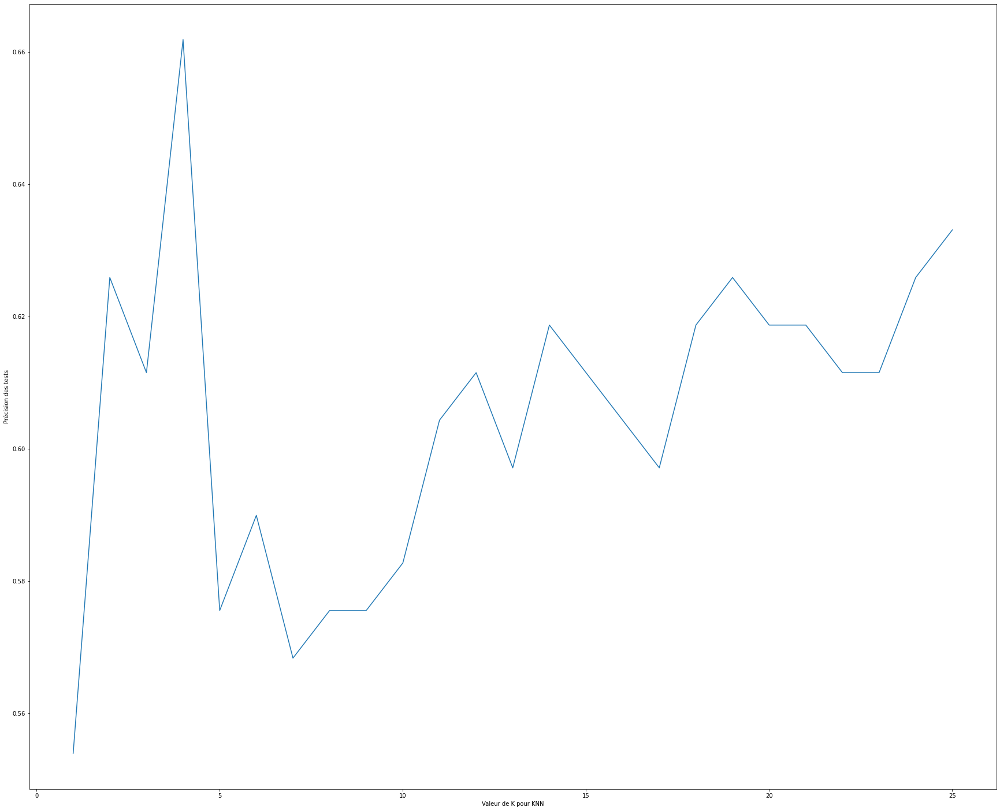

In [146]:
# tracer la relation entre K et la précision des tests
#plt.plot(x_axis, y_axis)
plt.plot(k_diff, k_scores)
plt.xlabel('Valeur de K pour KNN')
plt.ylabel('Précision des tests')

Interprétation

D'après la carte thermique de corrélation ci-dessus, nous pouvons conclure que :

1. La précision de la formation augmente à mesure que la complexité du modèle augmente.

2. La précision des tests pénalise les modèles trop complexes ou pas assez complexes.

3. Pour les modèles KNN, la complexité est déterminée par la valeur de K (valeur inférieure = plus complexe)

La performances de l'algorithme utilisé comme suit en utilisant un échantillon hors échantillon

In [191]:
# faire un tableau(array)
perfo_test=[4,2,1,1,1,2,3,2,1]

# créer une série
series_obj = pd.Series(perfo_test)

# convertir l'objet série en tableau
arr = series_obj.values

# série de remodelage .reshape(1, -1) car il contient un seul échantillon.
reshaped_arr = arr.reshape((1,-1))

print(reshaped_arr)

[[4 2 1 1 1 2 3 2 1]]


Nous évaluons maintenant les performances de l'algorithme utilisé comme suit en utilisant un échantillon hors échantillon :

In [192]:
perfo_e=knn.predict(reshaped_arr)

print(perfo_e.shape)
print(perfo_e)

(1,)
[2]


Interprétation

1. La classe cible pour l'échantillon hors échantillon est 2 qui signifie cancer bénin.

2. Il suffit d'évaluer le dataset breast pour relier la classe 2 à la vraie espèce de breast cancer.


Bonus : Profil d'un DataFrame

Le module suivant est tres utile pour l'explorer rapidement sans trop de travail.

Il existe un package séparé appelé pandas-profiling qui est conçu à cet effet.

In [193]:
!pip install pandas-profiling

In [194]:
import pandas_profiling

In [195]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]